<a href="https://colab.research.google.com/github/karioth/PredNet_tf/blob/main/datapipeline_tf_kitti/testing_kitti_tf_data.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
# @title Set Data Directories and Clone GitHub
! git clone https://github.com/karioth/PredNet_tf

# Path to the Kitti data
# can be found at https://drive.google.com/drive/folders/1pOXAI_pF5ikYHbvLIfULs2X6YXnGJh6J?usp=sharing
DATA_DIR = '/content/drive/MyDrive/Colab Notebooks/PredNet/raw_data/'

# Where reimplemented model will be saved
WEIGHTS_DIR = '/content/drive/MyDrive/Colab Notebooks/PredNet/model_data_keras2_adamax_raw_3/trained_weights.ckpt'

# Define paths to tensorboard logs
log_dir = '/content/drive/MyDrive/Colab Notebooks/PredNet/kitti_results_tensorboard_adamax_raw_3/logs'

%cd /content/PredNet_tf

from google.colab import drive
drive.mount('/content/drive')

Cloning into 'PredNet_tf'...
remote: Enumerating objects: 481, done.
remote: Counting objects: 100% (42/42), done.
remote: Compressing objects: 100% (36/36), done.
remote: Total 481 (delta 20), reused 13 (delta 6), pack-reused 439
Receiving objects: 100% (481/481), 26.93 MiB | 20.14 MiB/s, done.
Resolving deltas: 100% (265/265), done.
/content/PredNet_tf
Mounted at /content/drive


In [2]:
# @title Prepare the Paths of the Folders
from datapipeline_tf_kitti.dataset_creation import make_dataset
from datapipeline_tf_kitti.dataset_utils import get_relevant_paths, visualize_sequence
import tensorflow as tf


# Get the paths to the picture files used in the original PredNet
train_paths, test_paths, val_paths = get_relevant_paths(DATA_DIR, [DATA_DIR + 'sources_train.hkl', DATA_DIR + 'sources_test.hkl', DATA_DIR + 'sources_val.hkl'])

In [3]:
# Configuration
nt = 10  # Length of the image sequence
batch_size = 4  # Number of sequences per batch
N_seq_val = 100  # Number of sequences for validation
target_size = (128, 160)  # Target height and width of images
shuffle_buffer_size= 2000 # Number of images to shuffle in the buffer adjust to computational resources
base_dir = DATA_DIR  # Change this to your actual raw data directory

# Create the dataset
dataset_val = make_dataset(val_paths, sequence_length=nt, batch_size=batch_size, target_size=target_size, N_seq=N_seq_val)
dataset_train = make_dataset(train_paths, sequence_length=nt, batch_size=batch_size, target_size=target_size, shuffle=True, shuffle_buffer_size=shuffle_buffer_size)

dataset.element_spec: (TensorSpec(shape=(None, 10, 128, 160, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None,), dtype=tf.float32, name=None))
Features shape: (4, 10, 128, 160, 3)


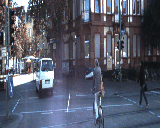

Shape of the sequence: (10, 128, 160, 3)


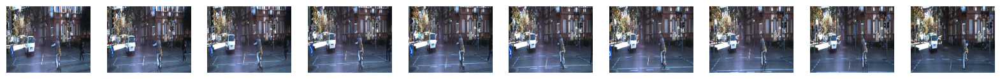

In [4]:
# @title Checking Shapes
print(f"dataset.element_spec: {dataset_val.element_spec}")

for example in dataset_val.take(1):
    features = example[0]
    print(f"Features shape: {features.shape}")
visualize_sequence(dataset_val, 1)

In [5]:
#@title Model Definition
import tensorflow as tf
import tqdm
import os
import numpy as np
from model import PredNetModel

# Training parameters, matching the original
nb_epoch = 150
batch_size = batch_size
nt = nt
# Model hyperparam -- matching the original

im_height, im_width, n_channels = (128, 160, 3)
input_shape = (batch_size, nt, im_height, im_width, n_channels)
stack_sizes = (n_channels, 48, 96, 192)
R_stack_sizes = stack_sizes
A_filt_sizes = (1, 3, 3, 3) #first element doesnt matter, since that conv layer never gets built -- there for list comprehension simplicity.
Ahat_filt_sizes = (3, 3, 3, 3)
R_filt_sizes = (3, 3, 3, 3)
layer_loss_weights = np.array([1., 0., 0., 0.])  # error weighting for each layer in final loss; "L_0" model:  [1, 0, 0, 0], "L_all": [1, 0.1, 0.1, 0.1] i.e, we only care about minimizing error at the bottom where the next frame gets predicted
layer_loss_weights = np.expand_dims(layer_loss_weights, 1)
time_loss_weights = 1./ (nt - 1) * np.ones((nt,1))  # equally weight the error of all timesteps except the first
time_loss_weights[0] = 0

#Define and build model. Using compile() to add flexibility of optimizer/loss to use. We are sticking with the originals for fair comparison.
prednet = PredNetModel(stack_sizes = stack_sizes, R_stack_sizes = R_stack_sizes, A_filt_sizes = A_filt_sizes, Ahat_filt_sizes = Ahat_filt_sizes, R_filt_sizes = R_filt_sizes,layer_loss_weights = layer_loss_weights, time_loss_weights= time_loss_weights)
prednet.build(input_shape)
prednet.summary()
prednet.compile(optimizer=tf.keras.optimizers.Adam(), loss=tf.keras.losses.MeanAbsoluteError()) #Using model.compile for extra flexibility

print('\nReimplementation has slightly more parameters, likely due to using ConvLSTM2Dcell object instead of handcoding it')



Model: "pred_net_model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 pred_net__cell (PredNet_Ce  multiple                  6576      
 ll)                                                             
                                                                 
 pred_net__cell_1 (PredNet_  multiple                  521280    
 Cell)                                                           
                                                                 
 pred_net__cell_2 (PredNet_  multiple                  2157120   
 Cell)                                                           
                                                                 
 pred_net__cell_3 (PredNet_  multiple                  5973120   
 Cell)                                                           
                                                                 
 time_distributed (TimeDist  multiple               

In [6]:
# @title Model Traning (Skip if you downloaded pretrained weights)
# Its pretty intensive, so A100 or V100 gpu's are recomended if running on collab.
save = True

lr_schedule = lambda epoch: 0.001 if epoch < 75 else 0.0001
callbacks = [tf.keras.callbacks.LearningRateScheduler(lr_schedule)]
tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir)
callbacks.append(tensorboard_callback)

# # dataset not infinite - calculate max epochs in one go
# x = 0
# for _ in  dataset_train_1:
#     x += 1
#     print(x)
# train_dataset_sequences = x*batch_size
train_dataset_sequences = 40880 # can be calculated by going through dataset
nb_epoch = 150 # match original
batch_size = batch_size # 4
steps_per_epoch = 125 # match original
max_epoch_per_fit = train_dataset_sequences // (batch_size * steps_per_epoch) # Maximum epochs per `model.fit` call without exhausting the dataset

if save:
    model_checkpoint_callback = tf.keras.callbacks.ModelCheckpoint(
        filepath = WEIGHTS_DIR,
        monitor='val_loss',
        verbose=0,
        save_best_only=True,
        save_weights_only=True,
        mode='auto',
        save_freq='epoch',
        initial_value_threshold=0.035
    )
    callbacks.append(model_checkpoint_callback)

epochs_completed = 0  # Track the total epochs completed

# this unorthodox training loop to match better the original training for comparison
while epochs_completed < nb_epoch:
    # Determine how many epochs to run in this iteration
    epochs_this_iter = min(max_epoch_per_fit, nb_epoch - epochs_completed)
    final_epoch = epochs_completed + epochs_this_iter  # This will be the final epoch for this iteration

    # Train the model
    prednet.fit(x=dataset_train, validation_data=dataset_val,
                epochs=final_epoch,
                initial_epoch=epochs_completed,
                steps_per_epoch=steps_per_epoch,
                callbacks=callbacks)

    # Update the total number of completed epochs
    epochs_completed = final_epoch
    print(f"Completed {epochs_completed}/{nb_epoch} epochs.")

Epoch 1/81
125/125 [==============================] - 283s 465ms/step - loss: 0.0457 - val_loss: 0.0466 - lr: 0.0010
Epoch 2/81
125/125 [==============================] - 48s 388ms/step - loss: 0.0332 - val_loss: 0.0431 - lr: 0.0010
Epoch 3/81
125/125 [==============================] - 48s 388ms/step - loss: 0.0343 - val_loss: 0.0398 - lr: 0.0010
Epoch 4/81
125/125 [==============================] - 49s 391ms/step - loss: 0.0295 - val_loss: 0.0388 - lr: 0.0010
Epoch 5/81
125/125 [==============================] - 48s 389ms/step - loss: 0.0278 - val_loss: 0.0376 - lr: 0.0010
Epoch 6/81
125/125 [==============================] - 49s 391ms/step - loss: 0.0285 - val_loss: 0.0372 - lr: 0.0010
Epoch 7/81
125/125 [==============================] - 50s 404ms/step - loss: 0.0290 - val_loss: 0.0367 - lr: 0.0010
Epoch 8/81
125/125 [==============================] - 50s 399ms/step - loss: 0.0301 - val_loss: 0.0360 - lr: 0.0010
Epoch 9/81
125/125 [==============================] - 50s 401ms/step - 

In [10]:
#@title Load tensorboard to visualize loss during traning
%load_ext tensorboard
%tensorboard --logdir '/content/drive/MyDrive/Colab Notebooks/PredNet/kitti_results_tensorboard_adamax_raw_3/logs'

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


Reusing TensorBoard on port 6006 (pid 35937), started 0:01:27 ago. (Use '!kill 35937' to kill it.)

<IPython.core.display.Javascript object>

In [11]:
# @title Load weights if saved
prednet.load_weights(WEIGHTS_DIR)

In [12]:
# @title Model Evaluation
'''
Evaluate trained PredNet on KITTI sequences.
Calculates mean-squared error and plots predictions.
'''

import os
import numpy as np
import matplotlib
matplotlib.use('Agg')
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec


n_plot = 40
batch_size = 10
nt = 10


# Create an instance of SequenceGenerator for the test data
X_test = make_dataset(test_paths, sequence_length=nt, batch_size=batch_size, target_size=target_size, sequence_start_mode='unique')
all_images = []

for images, _ in X_test:
    # Convert the tensors to numpy arrays
    images_np = images.numpy()

    # Append the arrays to the lists
    all_images.append(images_np)

# Concatenate all elements to form a single numpy array
X_test = np.concatenate(all_images, axis=0)

print(X_test.shape)

X_hat = prednet.predict(X_test, batch_size)

# Compare MSE of PredNet predictions vs. using last frame.  Write results to prediction_scores.txt
mse_model = np.mean( (X_test[:, 1:] - X_hat[:, 1:])**2 )  # look at all timesteps except the first
mse_prev = np.mean( (X_test[:, :-1] - X_test[:, 1:])**2 )
# if not os.path.exists(RESULTS_SAVE_DIR): os.mkdir(RESULTS_SAVE_DIR)
# f = open(RESULTS_SAVE_DIR + 'prediction_scores.txt', 'w')
# f.write("Model MSE: %f\n" % mse_model)
print("Model MSE: %f\n" % mse_model)
# f.write("Previous Frame MSE: %f" % mse_prev)
print("Previous Frame MSE: %f" % mse_prev)
# f.close()


(80, 10, 128, 160, 3)
8/8 [==============================] - 3s 151ms/step
Model MSE: 0.009985

Previous Frame MSE: 0.030935


Model MSE: 0.00998525507748127
Previous Frame MSE: 0.030934762209653854


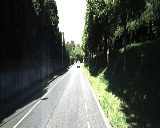

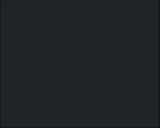

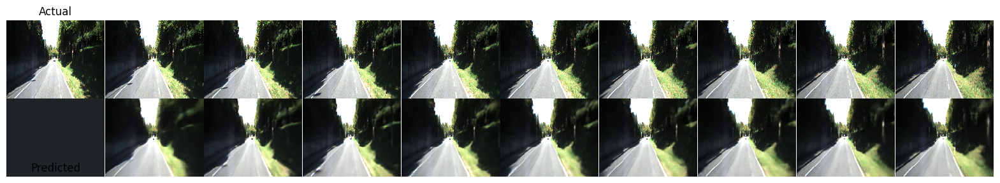

In [15]:
from data_utils import visualize_sequence_as_gif
%matplotlib inline


def display_sequences(X_test, X_hat, RESULTS_SAVE_DIR, save=False, gif=False, mse=False, n_sequences=5, nt=10):
    '''
    Display or save comparison of actual sequences and PredNet predictions.

    Parameters:
    - X_test: Actual pictures.
    - X_hat: Predicted pictures
    - RESULTS_SAVE_DIR: Directory where results are saved.
    - save: Flag if plots should be saved.
    - gif: Flag if gif should be shown.
    - mse: Flag if mse should be printed.
    - n_sequences: Number of sequences to display or save. Default is 5.
    - nt: Number of timesteps per sequence. Default is 10.
    '''
    if mse:
        # Calculate MSE for model and previous frame
        mse_model = np.mean((X_test[:, 1:] - X_hat[:, 1:])**2)
        mse_prev = np.mean((X_test[:, :-1] - X_test[:, 1:])**2)
        print(f"Model MSE: {mse_model}")
        print(f"Previous Frame MSE: {mse_prev}")

    # Ensure the save directory exists
    if save and not os.path.exists(RESULTS_SAVE_DIR):
        os.makedirs(RESULTS_SAVE_DIR)

    # Display or save some predictions
    aspect_ratio = float(X_hat.shape[2]) / X_hat.shape[3]
    plot_idx = np.random.permutation(X_test.shape[0])[:n_sequences]

    for seq_num, i in enumerate(plot_idx):
        plt.figure(figsize=(nt*2, 4*aspect_ratio))
        gs = gridspec.GridSpec(2, nt)
        gs.update(wspace=0., hspace=0.)

        if gif:
            # Ensure the sequence is in the correct format
            sequence_test = X_test[i]
            sequence_pred = X_hat[i]
            visualize_sequence_as_gif((255 * sequence_test).astype(np.uint8))
            visualize_sequence_as_gif((255 * sequence_pred).astype(np.uint8))

        for t in range(nt):
            plt.subplot(gs[0, t])
            plt.imshow(X_test[i, t], interpolation='none')
            plt.axis('off')
            if t == 0: plt.title('Actual', loc='center')

            plt.subplot(gs[1, t])
            plt.imshow(X_hat[i, t], interpolation='none')
            plt.axis('off')
            if t == 0: plt.title('Predicted', loc='center', y=0)

        if save:
            save_path = os.path.join(RESULTS_SAVE_DIR, f"sequence_{seq_num+1}.png")
            plt.savefig(save_path)
            plt.close()  # Close the figure to avoid displaying it in Jupyter notebooks
            print(f"Saved: {save_path}")
        else:
            plt.show()


display_sequences(X_test, X_hat, None, save=False, gif=True, mse=True, n_sequences=1, nt=10)

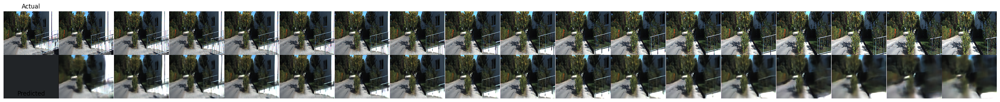

In [17]:
def predict_future_sequence(prednet, X_test, start_idx, n_predictions):
    """
    Predicts future frames by iteratively updating the sequence with the last predicted frame,
    while also constructing the corresponding ground truth sequence.

    Parameters:
    - prednet: The trained PredNet model.
    - X_test: Test dataset containing sequences.
    - start_idx: Index to start the prediction from within the dataset.
    - n_predictions: The number of future frames to predict beyond the initial sequence.

    Returns:
    - A tuple of two arrays: one containing the predicted frames including images predicted on predicted images,
      and one containing the actual frames from the dataset for comparison.
    """

    # Ensure there is a subsequent sequence available for comparison
    if start_idx >= len(X_test) - 1:
        raise ValueError("No subsequent sequence available for comparison.")
    if n_predictions > 9:
        raise ValueError("Max number of predictions is 9")

    # Get the initial sequence and the next sequence for comparison
    initial_sequence = np.expand_dims(X_test[start_idx], axis=0)
    initial_sequence_next = np.expand_dims(X_test[start_idx + 1], axis=0)

    # Start with the initial sequence to accumulate the predictions
    current_sequence = initial_sequence

    # Variable to store the ground truth frames corresponding to the predictions
    current_original_seq = initial_sequence

    # Loop to predict each subsequent frame
    for i in range(n_predictions):
        # Predict the next set of frames using the current sequence
        next_prediction = prednet(current_sequence)

        # Take the last frame from the prediction to extend the sequence
        last_frame_predicted = next_prediction[:, -1:, ...]

        # Concatenate the predicted frame to the sequence and use the last seq_length frames
        current_sequence = np.concatenate((current_sequence, last_frame_predicted), axis=1)

        # Update the ground truth sequence with the next frame
        current_original_seq = np.concatenate((current_original_seq, initial_sequence_next[:, i:i+1, ...]), axis=1)
        #display_sequences(current_original_seq, next_prediction, RESULTS_SAVE_DIR, save=False, n_sequences=1, nt=10+i)

    return next_prediction, current_original_seq

predicted_seq, original_seq = predict_future_sequence(prednet, X_test, start_idx=5, n_predictions=9)
display_sequences(original_seq, predicted_seq, None, save=False, n_sequences=1, nt=10+8)